In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format

In [80]:
import pandas as pd
import math
import seaborn as sns
from matplotlib import pyplot as plt
import re
import numpy as np
import geopandas as gpd
from shapely.geometry import Point # Point class
from shapely.geometry import shape
import io
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
from geopy.geocoders import Nominatim
from time import sleep
from datetime import datetime

#  tahore, placer and El Dorado Location Data Pattern

In [4]:
# read the daily Volume
daily_volume=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/eco_daily_volume_2019_2016_data.csv')
daily_volume.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,Flag,no_of_days_weekly_data_collected
0,0,671,2016,1,4,Monday,1,12.00,24,193.00,96,night,0.00,day,12.00,0,0,7
1,1,671,2016,1,5,Tuesday,1,18.00,24,211.00,120,night,6.00,day,12.00,0,0,7
2,2,671,2016,1,6,Wednesday,1,11.00,24,222.00,144,night,0.00,day,11.00,0,0,7
3,3,671,2016,1,7,Thursday,1,26.00,24,248.00,168,night,3.00,day,23.00,0,0,7
4,4,671,2016,1,8,Friday,1,38.00,24,286.00,192,night,6.00,day,32.00,0,0,7


In [6]:
# bring the lat and long of the counters
loc=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/Eco_combined_data_rural_vs_urban_before_QA_QC.csv')
loc1=loc[['ID','year','latitude','longitude','location']]
loc2=loc1.drop_duplicates(subset=['ID','latitude','longitude'], keep='first')
loc2.shape

(406, 5)

In [45]:
# bring the location based on lat and long
def city_state_country(row):
    coord = f"{row['latitude']}, {row['longitude']}"
    sleep(1)
    location = geolocator.reverse(coord, exactly_one=True, language='en')
    if not location:
        # if you see many in a row, it's probably Nominatim blocking you.
        # if it's just every once in a while, there were just some bad results. 
        print('Failed with coord: ', coord)
        row['road'],row['city'],row['county'], row['state'], row['country'] = None, None, None
        return row
    address = location.raw['address']
    city = address.get('city', '')
    county=address.get('county', '')
    state = address.get('state', '')
    country = address.get('country', '')
    row['road']=address.get('road', '')
    row['city'] = city
    row['county'] = county
    row['state'] = state
    row['country'] = country
    return row

In [46]:
city_state1 = loc2.apply(city_state_country, axis=1)
city_state1.head()

,ID,year,latitude,longitude,location,road,city,county,state,country
0,671,2016,37.79,-122.46,urban,Bay Area Ridge Trail,San Francisco,,California,United States
35064,1127,2016,37.80,-122.42,urban,Broadway,San Francisco,,California,United States
70128,2415,2016,37.77,-122.44,urban,Fell Street,San Francisco,,California,United States
105192,2691,2016,35.29,-120.66,urban,Rail Road Safety Trail,San Luis Obispo,San Luis Obispo County,California,United States
140256,2692,2016,35.29,-120.66,urban,Rail Road Safety Trail,San Luis Obispo,San Luis Obispo County,California,United States


In [47]:
city_state1['city'].unique(),city_state1['county'].unique()

(array(['San Francisco', 'San Luis Obispo', '', 'Orange', 'Oakland',
        'Oceanside', 'Escondido', 'San Diego', 'Chula Vista', 'Vista',
        'El Cajon', 'Berkeley', 'Los Angeles', 'Huntington Beach',
        'Anaheim', 'Fremont', 'Irvine', 'San Rafael', 'Richmond',
        'San Jose'], dtype=object),
 array(['', 'San Luis Obispo County', 'Orange County', 'Alameda County',
        'San Diego County', 'CAL Fire San Diego Unit', 'Marin County',
        'San Mateo County', 'Los Angeles County', 'Contra Costa County',
        'El Dorado County', 'Placer County', 'Humboldt County',
        'Fresno County', 'Yolo County', 'Santa Clara County'], dtype=object))

In [ ]:
# it seesm google nomination is pulling empty city for tahoe city, so use the adress to identify the tahoe location counter

In [48]:
rural=city_state1.loc[city_state1['location']=='rural']
rural

,ID,year,latitude,longitude,location,road,city,county,state,country
6627096,23303,2016,37.86,-122.57,rural,Dias Ridge Trail,,Marin County,California,United States
7398504,26339,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7433568,26340,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7819272,30664,2016,38.93,-120.03,rural,Emerald Bay Road,,El Dorado County,California,United States
7854336,30666,2016,39.09,-120.17,rural,Sacramento Avenue,,Placer County,California,United States
7889400,30667,2016,39.16,-120.16,rural,Truckee River Bike Trail,,Placer County,California,United States
7994592,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8240040,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8766000,38912,2016,39.09,-120.16,rural,Homewood Class 1 Trail,,Placer County,California,United States
9677664,46602,2016,38.93,-120.05,rural,Fallen Leaf Road,,El Dorado County,California,United States


In [49]:
Tahoe_city_counter = city_state1[city_state1['road'].str.contains('Lake Tahoe Boulevard Bike Path', regex=False, case=False, na=False)]
Tahoe_city_counter

,ID,year,latitude,longitude,location,road,city,county,state,country
7994592,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8240040,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
9782856,47003,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
10378944,51027,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
10414008,51028,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [59]:
# lets plot the daily volume by dat for Tahoe city counter
tahoe_dv=pd.merge(daily_volume,Tahoe_city_counter, left_on=['ID','year'], right_on=['ID','year'], how='inner')
tahoe_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,Flag,no_of_days_weekly_data_collected,latitude,longitude,location,road,city,county,state,country
0,157395,51027,2016,12,12,Monday,50,20.00,24,122.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
1,157396,51027,2016,12,13,Tuesday,50,6.00,24,128.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
2,157397,51027,2016,12,14,Wednesday,50,14.00,24,142.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
3,157398,51027,2016,12,15,Thursday,50,5.00,24,147.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
4,157399,51027,2016,12,16,Friday,50,4.00,24,151.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
5,157400,51027,2016,12,17,Saturday,50,11.00,24,162.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
6,157401,51027,2016,12,18,Sunday,50,10.00,24,172.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [57]:
daily_volume.shape,tahoe_dv.shape

((161630, 18), (161634, 26))

In [78]:
# Lets check with Placer County and El Dorado County
placer= city_state1[city_state1['county'].str.contains('Placer County', regex=False, case=False, na=False)]
El= city_state1[city_state1['county'].str.contains('El Dorado County', regex=False, case=False, na=False)]
El

,ID,year,latitude,longitude,location,road,city,county,state,country
7398504,26339,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7433568,26340,2016,39.06,-120.04,rural,,,El Dorado County,California,United States
7819272,30664,2016,38.93,-120.03,rural,Emerald Bay Road,,El Dorado County,California,United States
7924464,30669,2016,38.95,-119.96,urban,Lake Tahoe Boulevard,,El Dorado County,California,United States
7959528,30670,2016,38.93,-119.98,urban,El Dorado/ Harrison Bike,,El Dorado County,California,United States
7994592,30671,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8029656,30672,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
8240040,36076,2016,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8275104,36077,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
8310168,36078,2016,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States


In [62]:
placer_dv=pd.merge(daily_volume,placer, left_on=['ID','year'], right_on=['ID','year'], how='inner')
placer_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,Flag,no_of_days_weekly_data_collected,latitude,longitude,location,road,city,county,state,country


In [ ]:
# it seems none of eco counter was qualified to be permanent counter according to hour QA and QC

In [63]:
El_dv=pd.merge(daily_volume,El, left_on=['ID','year'], right_on=['ID','year'], how='inner')
El_dv.head(15)

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,Flag,no_of_days_weekly_data_collected,latitude,longitude,location,road,city,county,state,country
0,155827,49628,2016,12,12,Monday,50,8.00,24,72.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
1,155828,49628,2016,12,13,Tuesday,50,6.00,24,78.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
2,155829,49628,2016,12,14,Wednesday,50,4.00,24,82.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
3,155830,49628,2016,12,15,Thursday,50,2.00,24,84.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
4,155831,49628,2016,12,16,Friday,50,1.00,24,85.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
5,155832,49628,2016,12,17,Saturday,50,8.00,24,93.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
6,155833,49628,2016,12,18,Sunday,50,2.00,24,95.00,...,0,7,38.86,-120.01,urban,US 50;CA 89,,El Dorado County,California,United States
7,157395,51027,2016,12,12,Monday,50,20.00,24,122.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
8,157396,51027,2016,12,13,Tuesday,50,6.00,24,128.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States
9,157397,51027,2016,12,14,Wednesday,50,14.00,24,142.00,...,0,7,38.89,-120.03,rural,Lake Tahoe Boulevard Bike Path,,El Dorado County,California,United States


In [64]:
El_dv.shape

(14, 26)

In [ ]:
# so, all Tahoe, placer and El Dorado County does not have enough data to check the seasonality, it seems most of the data is zero which was excluded in QA and QC process

In [79]:
# we will check the raw volume before major QA and QC to check the data
daily_vol6=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/eco_daily_raw_volume.csv')
daily_vol6['date']=pd.to_datetime(daily_vol6.year*10000+daily_vol6.month*100+daily_vol6.day,format='%Y%m%d')
daily_vol6['dayofyear'] = daily_vol6['date'].dt.dayofyear
# check Tahore City before QA and QC
mask = daily_vol6['ID'].isin(list(Tahoe_city_counter['ID']))
tahoe=daily_vol6.loc[mask]
tahoe.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
328840,328840,30671,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
328841,328841,30671,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
328842,328842,30671,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
328843,328843,30671,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
328844,328844,30671,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [82]:
check=tahoe.loc[tahoe['Daily_volume']>0]
check.groupby(['ID','year'])['ID'].count()

ID     year
36076  2017      2
47003  2018     36
51027  2016     37
       2017    328
       2018    304
       2019    297
51028  2018     36
Name: ID, dtype: int64

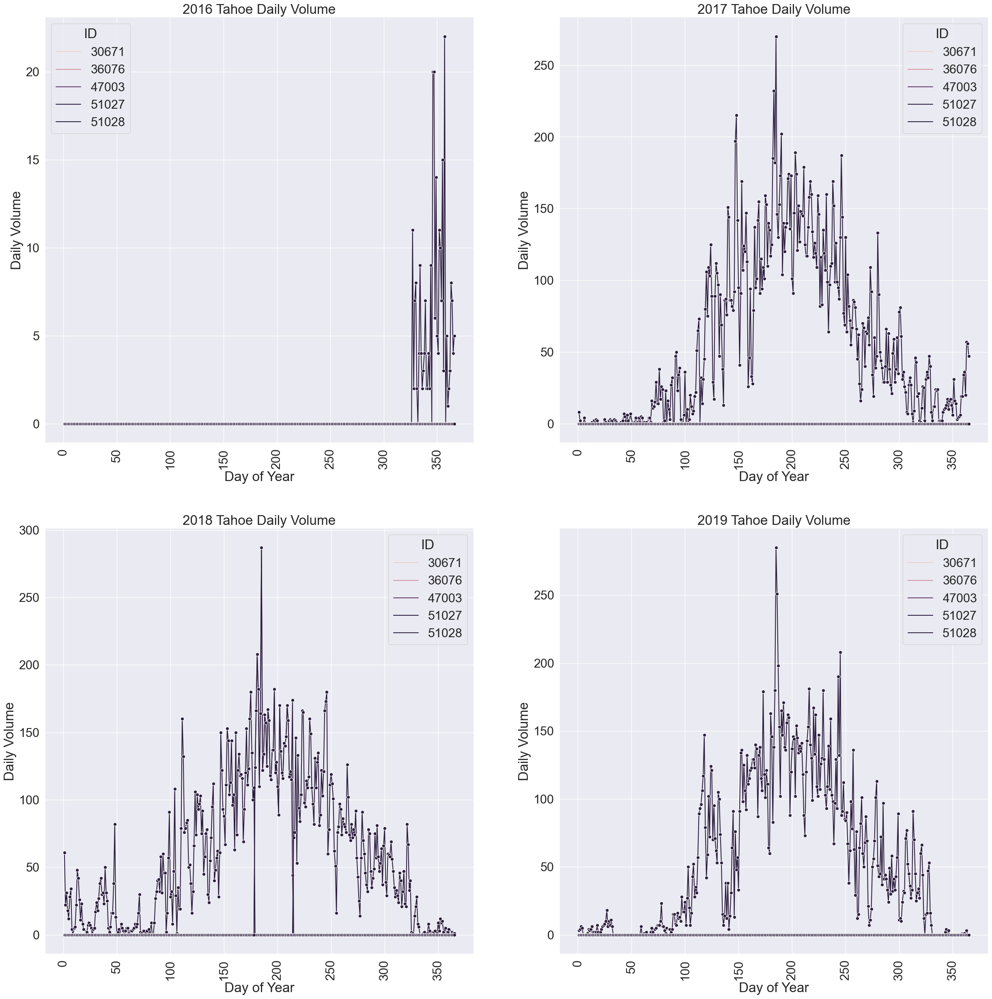

In [83]:
# lets plot
d16=tahoe.loc[tahoe['year']==2016]
d17=tahoe.loc[tahoe['year']==2017]
d18=tahoe.loc[tahoe['year']==2018]
d19=tahoe.loc[tahoe['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Tahoe Daily Volume')
ax2.title.set_text('2017 Tahoe Daily Volume')
ax3.title.set_text('2018 Tahoe Daily Volume')
ax4.title.set_text('2019 Tahoe Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

In [84]:
# Check the Placer County Data Pattern
# check Tahore City before QA and QC
pmask = daily_vol6['ID'].isin(list(placer['ID']))
placer_county=daily_vol6.loc[pmask]
placer_county.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
320080,320080,30660,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
320081,320081,30660,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
320082,320082,30660,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
320083,320083,30660,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
320084,320084,30660,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [85]:
pcheck=placer_county.loc[placer_county['Daily_volume']>0]
pcheck.groupby(['ID','year'])['ID'].count()

ID     year
30660  2017      8
       2019      8
30666  2017    163
       2018    230
       2019    208
30667  2018     47
       2019     95
38912  2017      7
39870  2017      5
39871  2017      4
39872  2017      7
       2019      7
39873  2017      1
39874  2017      1
49606  2018      7
       2019    225
50998  2019      2
51661  2019     45
52194  2018     47
       2019    247
53638  2019      2
Name: ID, dtype: int64

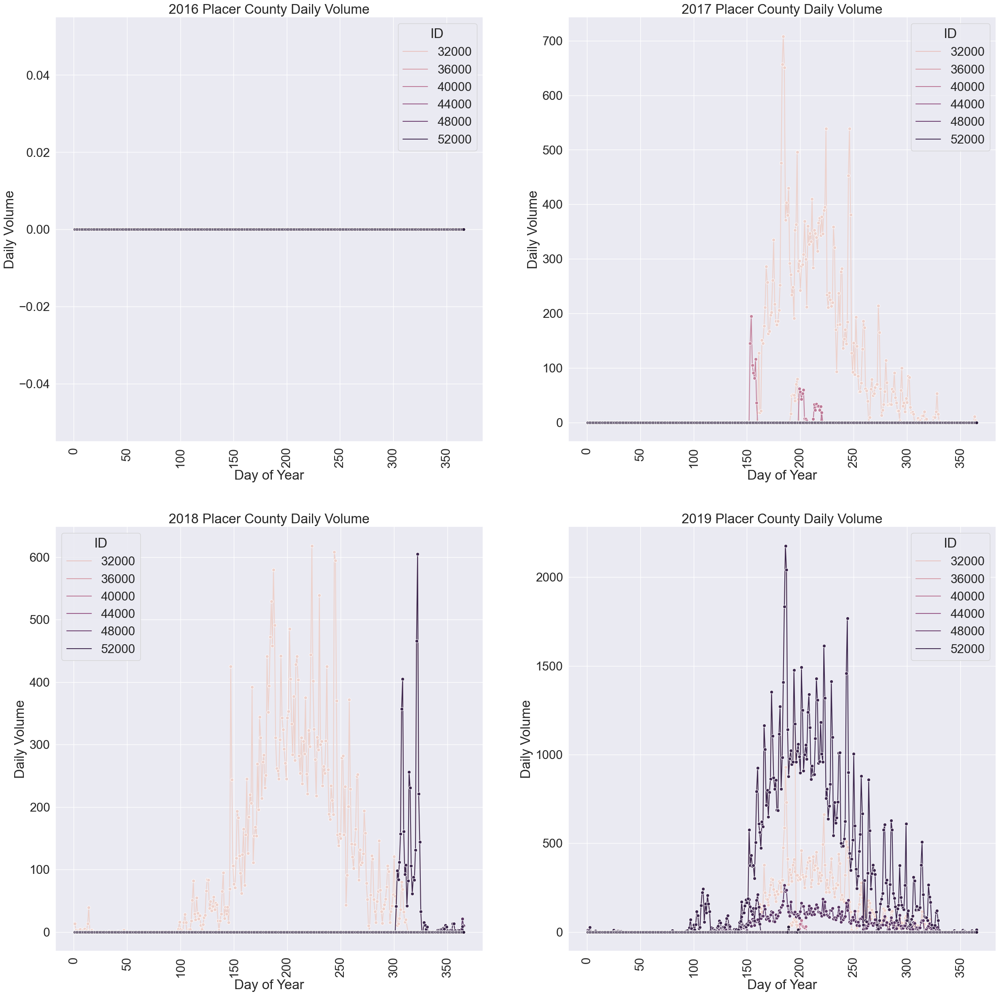

In [87]:
# lets plot
d16=placer_county.loc[placer_county['year']==2016]
d17=placer_county.loc[placer_county['year']==2017]
d18=placer_county.loc[placer_county['year']==2018]
d19=placer_county.loc[placer_county['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Placer County Daily Volume')
ax2.title.set_text('2017 Placer County Daily Volume')
ax3.title.set_text('2018 Placer County Daily Volume')
ax4.title.set_text('2019 Placer County Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

In [90]:
# check the data pattern for El Dorado County
emask = daily_vol6['ID'].isin(list(El['ID']))
El_county=daily_vol6.loc[emask]
El_county.head()

,Unnamed: 0,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,cum_hr,day_night_x,night_volume,day_night_y,day_volume,flag,date,dayofyear
304017,304017,26339,2016,1,1,Friday,53,0.00,24,0.00,24,night,0.00,day,0.00,0,2016-01-01,1
304018,304018,26339,2016,1,2,Saturday,53,0.00,24,0.00,48,night,0.00,day,0.00,0,2016-01-02,2
304019,304019,26339,2016,1,3,Sunday,53,0.00,24,0.00,72,night,0.00,day,0.00,0,2016-01-03,3
304020,304020,26339,2016,1,4,Monday,1,0.00,24,0.00,96,night,0.00,day,0.00,0,2016-01-04,4
304021,304021,26339,2016,1,5,Tuesday,1,0.00,24,0.00,120,night,0.00,day,0.00,0,2016-01-05,5


In [91]:
echeck=El_county.loc[El_county['Daily_volume']>0]
echeck.groupby(['ID','year'])['ID'].count()

ID     year
30664  2017    204
       2018    287
       2019    244
30669  2017      1
30670  2017      1
36076  2017      2
36077  2017      1
36078  2017      3
36730  2017      1
36731  2017     10
46602  2018     10
46622  2018      7
46886  2018     12
47003  2018     36
47311  2018      7
47312  2018     12
49554  2018      1
49555  2018      2
49628  2016     33
       2017    315
       2018    302
       2019    255
50992  2017     70
       2018    353
       2019    217
50993  2017     56
       2018    324
       2019    292
50994  2019      9
50996  2019     13
50997  2019      9
51027  2016     37
       2017    328
       2018    304
       2019    297
51028  2018     36
51029  2017      3
51030  2018      7
51031  2018      1
53637  2019      1
58246  2019    112
58297  2019     31
58298  2019     31
Name: ID, dtype: int64

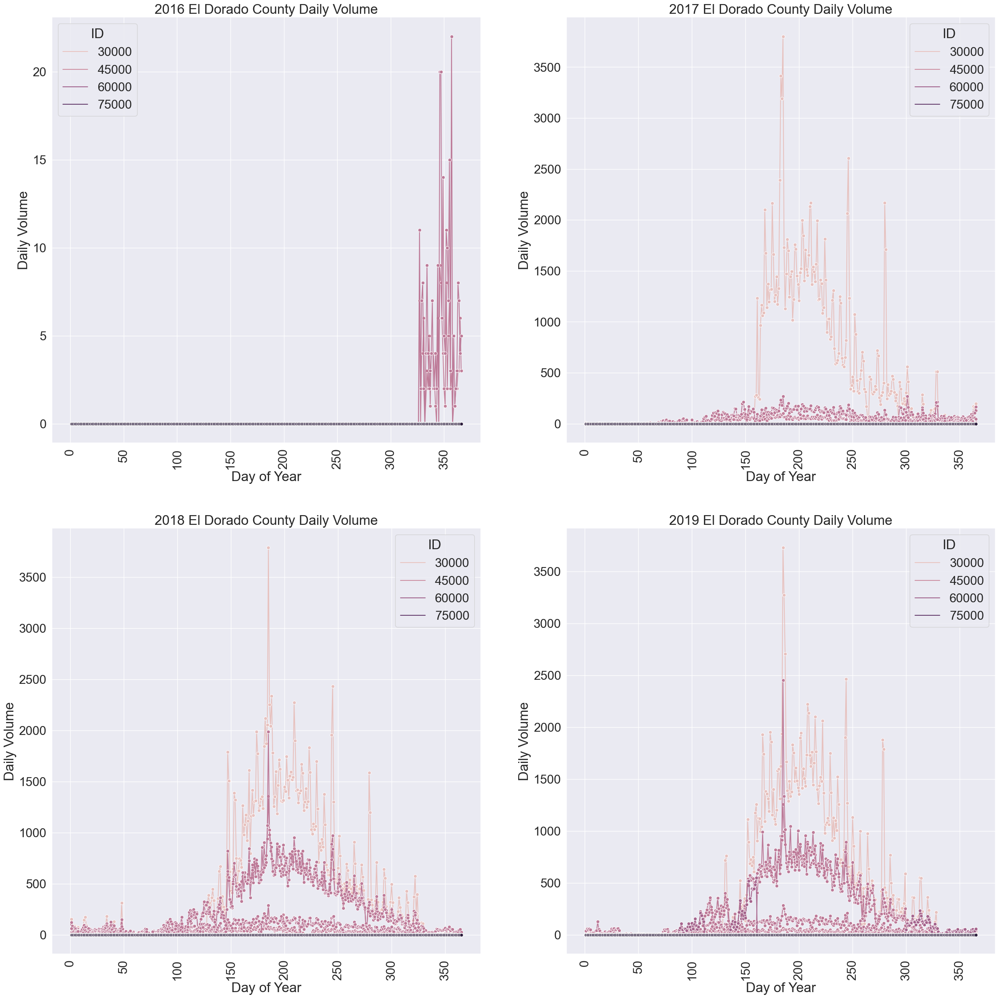

In [92]:
# lets plot
d16=El_county.loc[El_county['year']==2016]
d17=El_county.loc[El_county['year']==2017]
d18=El_county.loc[El_county['year']==2018]
d19=El_county.loc[El_county['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['dayofyear'],y=d16['Daily_volume'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['dayofyear'],y=d17['Daily_volume'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['dayofyear'],y=d18['Daily_volume'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['dayofyear'],y=d19['Daily_volume'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 El Dorado County Daily Volume')
ax2.title.set_text('2017 El Dorado County Daily Volume')
ax3.title.set_text('2018 El Dorado County Daily Volume')
ax4.title.set_text('2019 El Dorado County Daily Volume')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Daily Volume' )
ax1.set_xlabel('Day of Year')
ax2.set_ylabel('Daily Volume' )
ax2.set_xlabel('Day of Year')
ax3.set_ylabel('Daily Volume' )
ax3.set_xlabel('Day of Year')
ax4.set_ylabel('Daily Volume' )
ax4.set_xlabel('Day of Year')
plt.show()

# HOD Factor

In [93]:
# read hourly volume
hr_vol2=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/eco_hourly_clean_volume.csv')
# read permanent counters data afte QA and QC check
Permanent_counter=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/permanent_counter_2019_2016_AADBT_data.csv')
doh=pd.merge(hr_vol2,Permanent_counter,left_on=['ID','year'],right_on=['ID','year'],how='inner')

In [94]:
doh['DOH_Factor']=doh['counts']/doh['AADBT']
doh_weekday=doh.loc[doh['Week Day Status']=='Week Day']
doh_weekend=doh.loc[doh['Week Day Status']=='Weekend']
doh_weekend.head()

,Unnamed: 0_x,index,ID,year,month,day,weekno,dayofweek,weekday_Status,starttime,...,location_x,Flag,Unnamed: 0_y,location_y,latitude_y,longitude_y,AADBT,no_of_months_data_collected,type,DOH_Factor
1,31,31,671,2016,1,2,53,5,1,07:00:00,...,urban,0,385,urban,37.79,-122.46,53.55,12,eco_permanent,0.00
2,55,55,671,2016,1,3,53,6,1,07:00:00,...,urban,0,385,urban,37.79,-122.46,53.55,12,eco_permanent,0.04
8,199,199,671,2016,1,9,1,5,1,07:00:00,...,urban,0,385,urban,37.79,-122.46,53.55,12,eco_permanent,0.02
9,223,223,671,2016,1,10,1,6,1,07:00:00,...,urban,0,385,urban,37.79,-122.46,53.55,12,eco_permanent,0.04
15,367,367,671,2016,1,16,2,5,1,07:00:00,...,urban,0,385,urban,37.79,-122.46,53.55,12,eco_permanent,0.00


In [95]:
doh_weekday_factor=pd.DataFrame({'Average_DOH_Factor':doh_weekday.groupby(['ID','year','starttime'])['DOH_Factor'].mean()}).reset_index()
doh_weekend_factor=pd.DataFrame({'Average_DOH_Factor':doh_weekend.groupby(['ID','year','starttime'])['DOH_Factor'].mean()}).reset_index()
doh_weekend_factor.head()

,ID,year,starttime,Average_DOH_Factor
0,671,2016,00:00:00,0.00
1,671,2016,01:00:00,0.00
2,671,2016,02:00:00,0.00
3,671,2016,03:00:00,0.00
4,671,2016,04:00:00,0.00


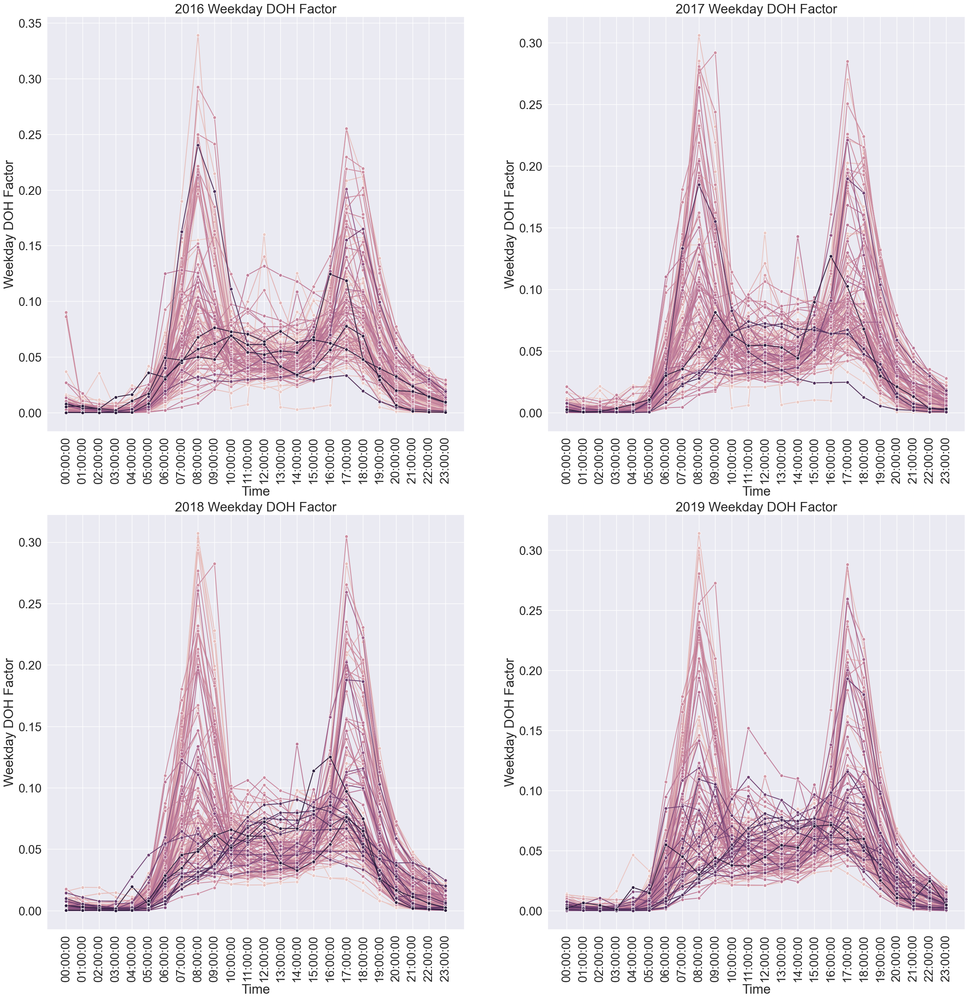

In [96]:
d16=doh_weekday_factor.loc[doh_weekday_factor['year']==2016]
d17=doh_weekday_factor.loc[doh_weekday_factor['year']==2017]
d18=doh_weekday_factor.loc[doh_weekday_factor['year']==2018]
d19=doh_weekday_factor.loc[doh_weekday_factor['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_DOH_Factor'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_DOH_Factor'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_DOH_Factor'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_DOH_Factor'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.title.set_text('2016 Weekday DOH Factor')
ax2.title.set_text('2017 Weekday DOH Factor')
ax3.title.set_text('2018 Weekday DOH Factor')
ax4.title.set_text('2019 Weekday DOH Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Weekday DOH Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Weekday DOH Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Weekday DOH Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Weekday DOH Factor' )
ax4.set_xlabel('Time')
plt.show()

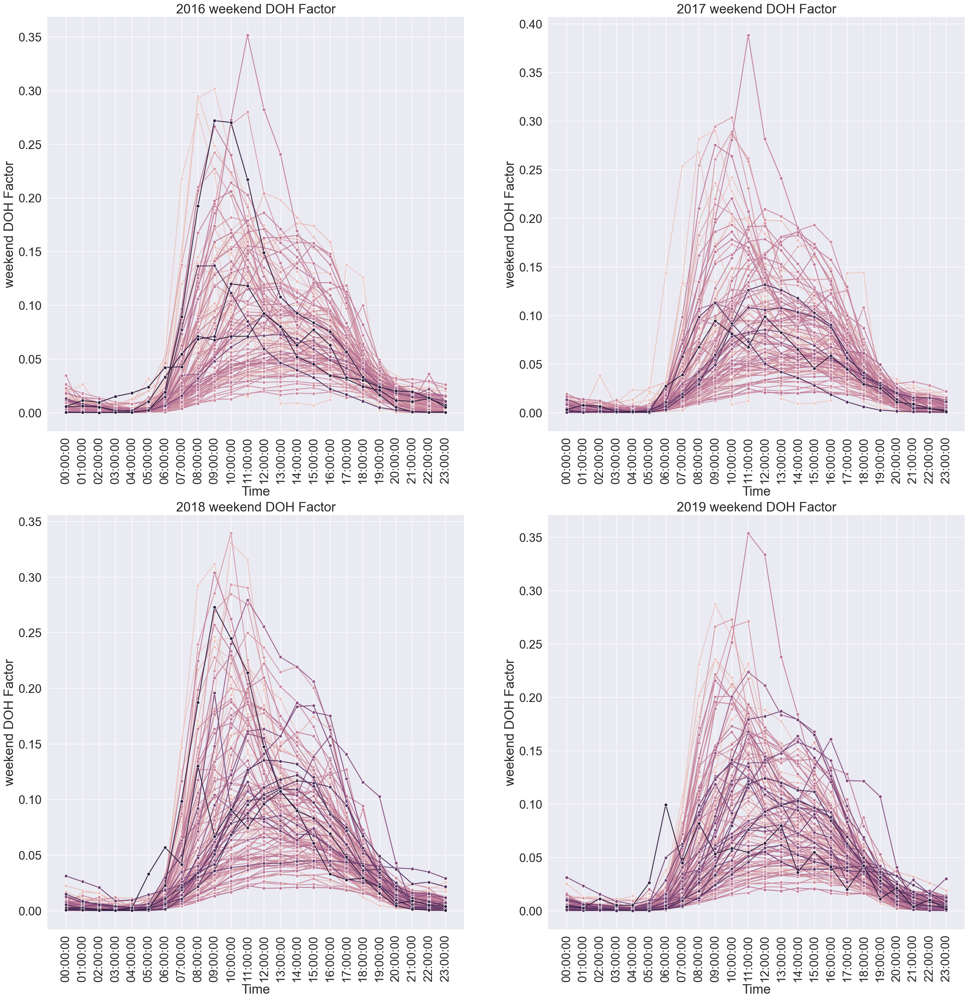

In [98]:
d16=doh_weekend_factor.loc[doh_weekend_factor['year']==2016]
d17=doh_weekend_factor.loc[doh_weekend_factor['year']==2017]
d18=doh_weekend_factor.loc[doh_weekend_factor['year']==2018]
d19=doh_weekend_factor.loc[doh_weekend_factor['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_DOH_Factor'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_DOH_Factor'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_DOH_Factor'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_DOH_Factor'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.title.set_text('2016 weekend DOH Factor')
ax2.title.set_text('2017 weekend DOH Factor')
ax3.title.set_text('2018 weekend DOH Factor')
ax4.title.set_text('2019 weekend DOH Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('weekend DOH Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('weekend DOH Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('weekend DOH Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('weekend DOH Factor' )
ax4.set_xlabel('Time')
plt.show()

# Now Calculate th Average Curve for each of DOH factor Case

In [99]:
doh_weekday_factor_group=pd.DataFrame({'Average_group_DOH_Factor':doh_weekday_factor.groupby(['year','starttime'])['Average_DOH_Factor'].mean()}).reset_index()
doh_weekend_factor_group=pd.DataFrame({'Average_group_DOH_Factor':doh_weekend_factor.groupby(['year','starttime'])['Average_DOH_Factor'].mean()}).reset_index()
doh_weekend_factor_group.head()

,year,starttime,Average_group_DOH_Factor
0,2016,00:00:00,0.01
1,2016,01:00:00,0.00
2,2016,02:00:00,0.00
3,2016,03:00:00,0.00
4,2016,04:00:00,0.00


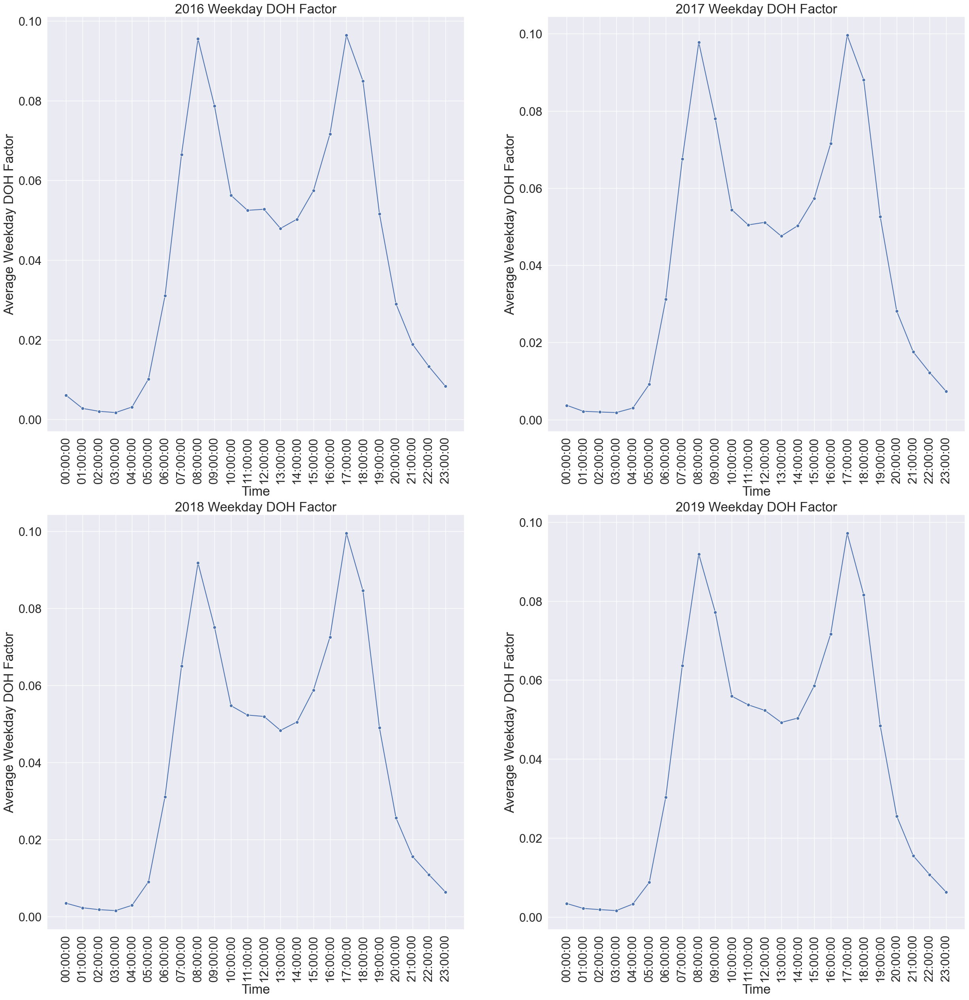

In [100]:
d16=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2016]
d17=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2017]
d18=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2018]
d19=doh_weekday_factor_group.loc[doh_weekday_factor_group['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_group_DOH_Factor'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
plt.xticks(rotation = 'vertical')
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Weekday DOH Factor')
ax2.title.set_text('2017 Weekday DOH Factor')
ax3.title.set_text('2018 Weekday DOH Factor')
ax4.title.set_text('2019 Weekday DOH Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Average Weekday DOH Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Average Weekday DOH Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Average Weekday DOH Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Average Weekday DOH Factor' )
ax4.set_xlabel('Time')
plt.show()

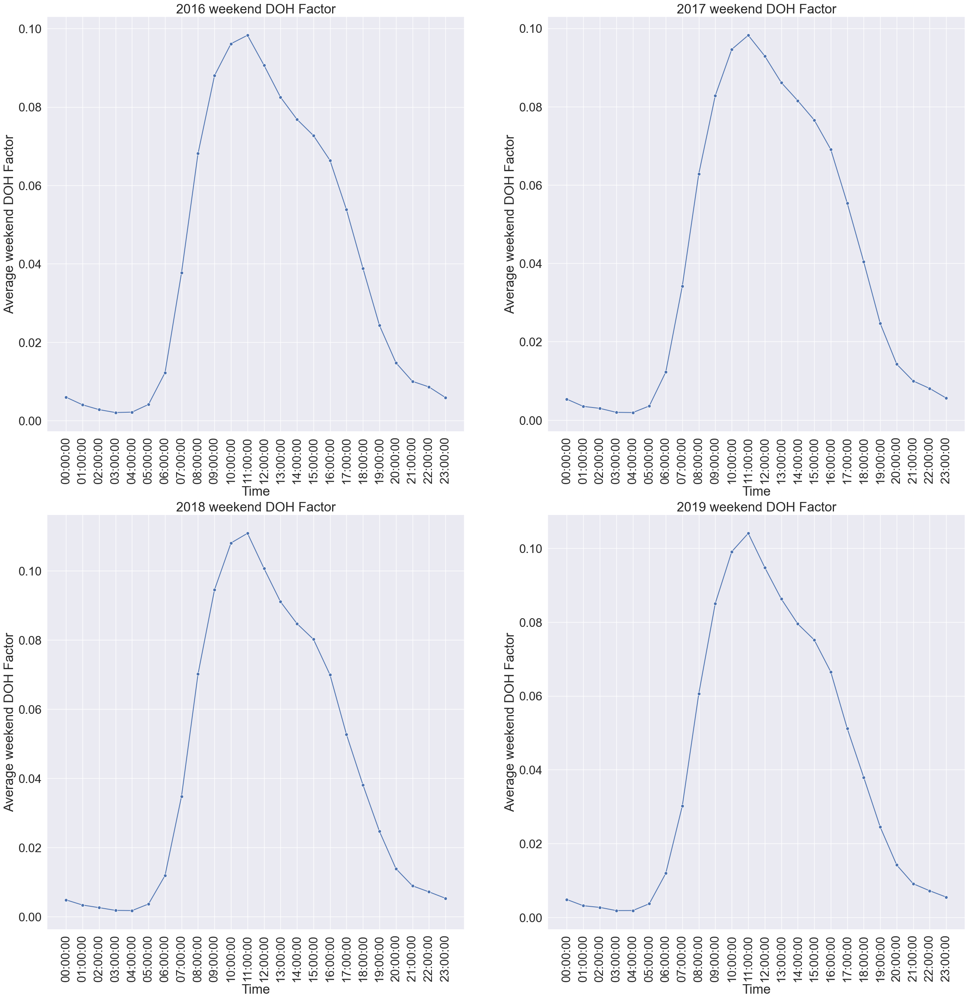

In [101]:
d16=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2016]
d17=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2017]
d18=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2018]
d19=doh_weekend_factor_group.loc[doh_weekend_factor_group['year']==2019]

sns.set(rc={'figure.figsize':(30,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['starttime'],y=d16['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['starttime'],y=d17['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['starttime'],y=d18['Average_group_DOH_Factor'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['starttime'],y=d19['Average_group_DOH_Factor'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 

ax1.title.set_text('2016 weekend DOH Factor')
ax2.title.set_text('2017 weekend DOH Factor')
ax3.title.set_text('2018 weekend DOH Factor')
ax4.title.set_text('2019 weekend DOH Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=90)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=90)
ax1.set_ylabel('Average weekend DOH Factor' )
ax1.set_xlabel('Time')
ax2.set_ylabel('Average weekend DOH Factor' )
ax2.set_xlabel('Time')
ax3.set_ylabel('Average weekend DOH Factor' )
ax3.set_xlabel('Time')
ax4.set_ylabel('Average weekend DOH Factor' )
ax4.set_xlabel('Time')
plt.show()

# Develop DOW Factor by Rural and Urban Areas

In [102]:
daily_vol10=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/eco_daily_volume_2019_2016_data.csv')
daily_vol110=pd.DataFrame({'weekly_volume':daily_vol10.groupby(['ID','year','month','weekno'])['Daily_volume'].mean()}).reset_index()
daily_vol110.head()

,ID,year,month,weekno,weekly_volume
0,671,2016,1,1,33.00
1,671,2016,1,2,28.43
2,671,2016,1,3,42.57
3,671,2016,1,4,47.71
4,671,2016,2,5,51.57


In [103]:
# import permanent counters
p1=pd.read_csv('D:/Bike_ped Exposure Model Project/Processed Data/permanent_counter_2019_2016_AADBT_data.csv')
# select the permanent counter data only after QA and QC
per_DOW=pd.merge(p1,daily_vol110,left_on=["ID",'year'],right_on=["ID",'year'], how='inner')
per_DOW.head()

,Unnamed: 0,ID,location,latitude,longitude,year,AADBT,no_of_months_data_collected,type,month,weekno,weekly_volume
0,0,3575,urban,32.66,-117.07,2018,263.32,10,eco_permanent,3,10,228.86
1,0,3575,urban,32.66,-117.07,2018,263.32,10,eco_permanent,3,11,214.14
2,0,3575,urban,32.66,-117.07,2018,263.32,10,eco_permanent,3,12,269.00
3,0,3575,urban,32.66,-117.07,2018,263.32,10,eco_permanent,4,14,294.57
4,0,3575,urban,32.66,-117.07,2018,263.32,10,eco_permanent,4,15,289.14


In [104]:
per_DOW.shape,daily_vol110.shape

((19632, 12), (23090, 5))

In [105]:
# Now bring the daily volume
DOW_data=pd.merge(daily_vol10,per_DOW,left_on=['ID','year','month','weekno'],right_on=['ID','year','month','weekno'],how='inner')
DOW_data.head()

,Unnamed: 0_x,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,Flag,no_of_days_weekly_data_collected,Unnamed: 0_y,location,latitude,longitude,AADBT,no_of_months_data_collected,type,weekly_volume
0,0,671,2016,1,4,Monday,1,12.00,24,193.00,...,0,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00
1,1,671,2016,1,5,Tuesday,1,18.00,24,211.00,...,0,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00
2,2,671,2016,1,6,Wednesday,1,11.00,24,222.00,...,0,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00
3,3,671,2016,1,7,Thursday,1,26.00,24,248.00,...,0,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00
4,4,671,2016,1,8,Friday,1,38.00,24,286.00,...,0,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00


In [106]:
from pandas.api.types import CategoricalDtype
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)
DOW_data['Day of Week'] = DOW_data['Day of Week'].astype(cat_type)

In [107]:
# Calculate the Hour of day Factor
DOW_data['DOW']=DOW_data['Daily_volume']/DOW_data['weekly_volume']
#DOW_data=DOW_data.sort_values(by=['Day of Week'])
#DOW_data_urban=DOW_data.loc[DOW_data['location']=='urban']
#DOW_data_rural=DOW_data.loc[DOW_data['location']=='rural']
DOW_data.head()

,Unnamed: 0_x,ID,year,month,day,Day of Week,weekno,Daily_volume,sum_hr,cum_Daily_volume,...,no_of_days_weekly_data_collected,Unnamed: 0_y,location,latitude,longitude,AADBT,no_of_months_data_collected,type,weekly_volume,DOW
0,0,671,2016,1,4,Monday,1,12.00,24,193.00,...,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00,0.36
1,1,671,2016,1,5,Tuesday,1,18.00,24,211.00,...,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00,0.55
2,2,671,2016,1,6,Wednesday,1,11.00,24,222.00,...,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00,0.33
3,3,671,2016,1,7,Thursday,1,26.00,24,248.00,...,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00,0.79
4,4,671,2016,1,8,Friday,1,38.00,24,286.00,...,7,385,urban,37.79,-122.46,53.55,12,eco_permanent,33.00,1.15


In [109]:
DOW=pd.DataFrame({'Average DOW':DOW_data.groupby(['ID','year','Day of Week'])['DOW'].mean()}).reset_index()

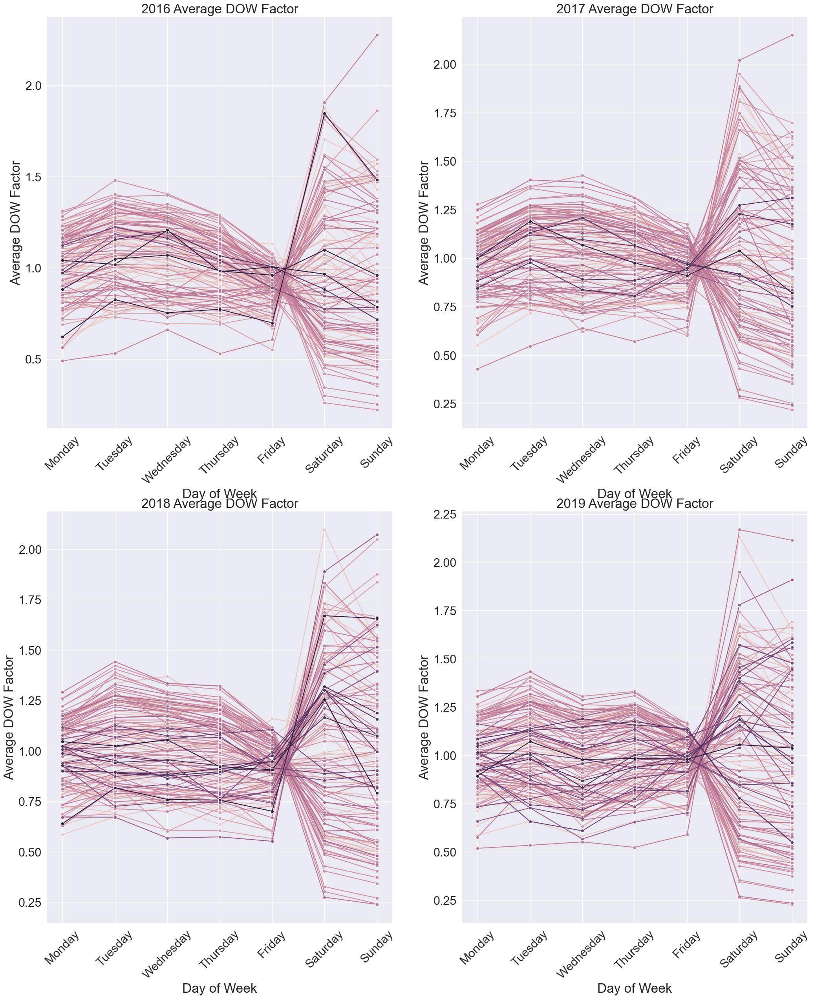

In [110]:
d16=DOW.loc[DOW['year']==2016]
d17=DOW.loc[DOW['year']==2017]
d18=DOW.loc[DOW['year']==2018]
d19=DOW.loc[DOW['year']==2019]

sns.set(rc={'figure.figsize':(25,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['Day of Week'],y=d16['Average DOW'],hue=d16['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['Day of Week'],y=d17['Average DOW'],hue=d17['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['Day of Week'],y=d18['Average DOW'],hue=d18['ID'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['Day of Week'],y=d19['Average DOW'],hue=d19['ID'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()
ax4.get_legend().remove()
ax1.title.set_text('2016 Average DOW Factor')
ax2.title.set_text('2017 Average DOW Factor')
ax3.title.set_text('2018 Average DOW Factor')
ax4.title.set_text('2019 Average DOW Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)
ax1.set_ylabel('Average DOW Factor' )
ax1.set_xlabel('Day of Week')
ax2.set_ylabel('Average DOW Factor' )
ax2.set_xlabel('Day of Week')
ax3.set_ylabel('Average DOW Factor' )
ax3.set_xlabel('Day of Week')
ax4.set_ylabel('Average DOW Factor' )
ax4.set_xlabel('Day of Week')
plt.show()

In [113]:
DOW_group=pd.DataFrame({'Average group DOW':DOW.groupby(['year','Day of Week'])['Average DOW'].mean()}).reset_index()

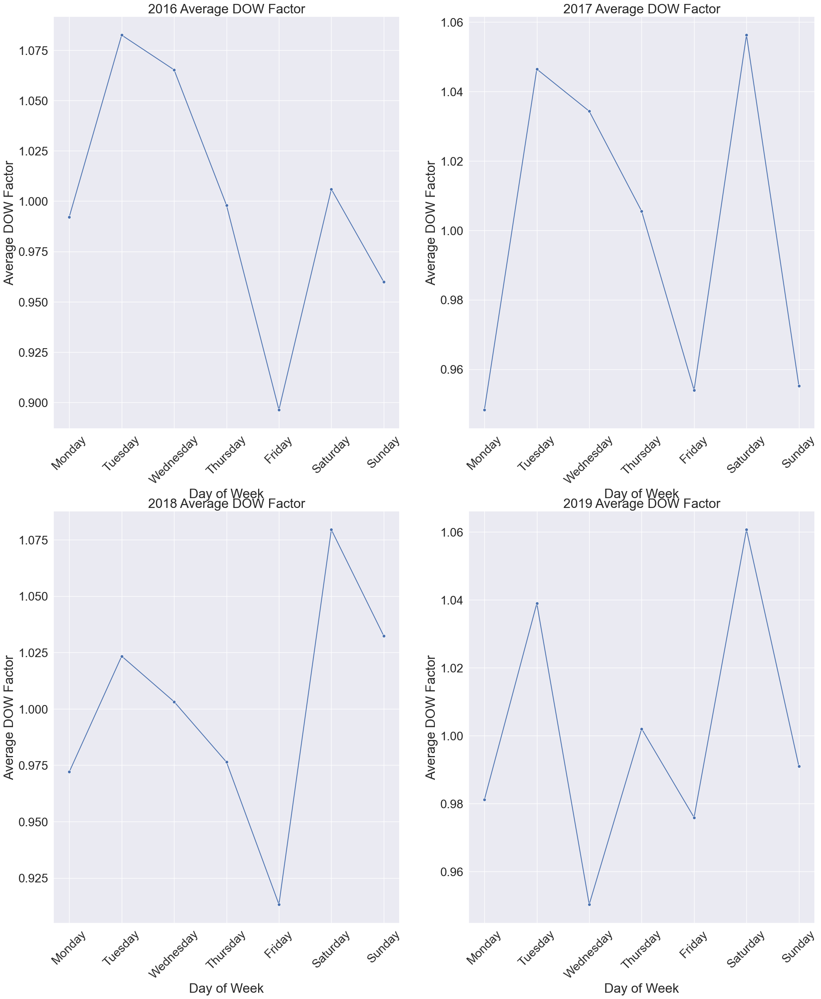

In [114]:
d16=DOW_group.loc[DOW_group['year']==2016]
d17=DOW_group.loc[DOW_group['year']==2017]
d18=DOW_group.loc[DOW_group['year']==2018]
d19=DOW_group.loc[DOW_group['year']==2019]

sns.set(rc={'figure.figsize':(25,30)})
sns.set(font_scale=2.0)
import seaborn as sns


fig, ax = plt.subplots(2,2)

ax1 = sns.lineplot(x=d16['Day of Week'],y=d16['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,0]) 
plt.xticks(rotation = 'vertical')
ax2 = sns.lineplot(x=d17['Day of Week'],y=d17['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[0,1]) 
plt.xticks(rotation = 'vertical')
ax3 = sns.lineplot(x=d18['Day of Week'],y=d18['Average group DOW'],
                   markers=True,marker="o", dashes=False,sort=True,ax=ax[1,0])
plt.xticks(rotation = 'vertical')
ax4 = sns.lineplot(x=d19['Day of Week'],y=d19['Average group DOW'],
                   markers=True, marker="o", dashes=False,sort=True,ax=ax[1,1]) 
#ax1.get_legend().remove()
#ax2.get_legend().remove()
#ax3.get_legend().remove()
#ax4.get_legend().remove()
ax1.title.set_text('2016 Average DOW Factor')
ax2.title.set_text('2017 Average DOW Factor')
ax3.title.set_text('2018 Average DOW Factor')
ax4.title.set_text('2019 Average DOW Factor')
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax3.xaxis.get_majorticklabels(), rotation=45)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45)
ax1.set_ylabel('Average DOW Factor' )
ax1.set_xlabel('Day of Week')
ax2.set_ylabel('Average DOW Factor' )
ax2.set_xlabel('Day of Week')
ax3.set_ylabel('Average DOW Factor' )
ax3.set_xlabel('Day of Week')
ax4.set_ylabel('Average DOW Factor' )
ax4.set_xlabel('Day of Week')
plt.show()

# End of the Coding